In [1]:
import pandas as pd
import numpy as np
import os
import gc
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import statsmodels.api as sm

import matplotlib.dates as mdates
from ydata_profiling import ProfileReport
%matplotlib inline

from itertools import product
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.stattools import kpss
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder, LabelEncoder

from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_squared_log_error

from sklearn.calibration import LabelEncoder
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error

import warnings
warnings.filterwarnings("ignore")

from sklearn.impute import SimpleImputer

pd.set_option('display.max_columns', None)
pd.options.display.float_format = '{:.2f}'.format


/opt/conda/lib/python3.10/site-packages/numba/core/decorators.py:262: NumbaDeprecationWarning: numba.generated_jit is deprecated. Please see the documentation at: https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-generated-jit for more information and advice on a suitable replacement.
  warnings.warn(msg, NumbaDeprecationWarning)
/opt/conda/lib/python3.10/site-packages/visions/backends/shared/nan_handling.py:51: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  def hasna(x: np.ndarray) -> bool:


In [2]:
train = pd.read_csv('/kaggle/input/data-mgt/train.csv', index_col=0)
test = pd.read_csv('/kaggle/input/data-mgt/test.csv', index_col = 0)
oil = pd.read_csv('/kaggle/input/data-mgt/oil.csv')
transactions = pd.read_csv('/kaggle/input/data-mgt/transactions.csv')
holidays = pd.read_csv('/kaggle/input/data-mgt/holidays_events.csv')
stores = pd.read_csv('/kaggle/input/data-mgt/stores.csv')


In [3]:
train.head()

,date,store_nbr,family,sales,onpromotion
id,,,,,
0,2013-01-01,1,AUTOMOTIVE,0.00,0
1,2013-01-01,1,BABY CARE,0.00,0
2,2013-01-01,1,BEAUTY,0.00,0
3,2013-01-01,1,BEVERAGES,0.00,0
4,2013-01-01,1,BOOKS,0.00,0


In [4]:
test.head()

,date,store_nbr,family,onpromotion
id,,,,
3000888,2017-08-16,1,AUTOMOTIVE,0
3000889,2017-08-16,1,BABY CARE,0
3000890,2017-08-16,1,BEAUTY,2
3000891,2017-08-16,1,BEVERAGES,20
3000892,2017-08-16,1,BOOKS,0


In [5]:
oil.head()

,date,dcoilwtico
0,2013-01-01,NaN
1,2013-01-02,93.14
2,2013-01-03,92.97
3,2013-01-04,93.12
4,2013-01-07,93.20


In [6]:
transactions.head()

,date,store_nbr,transactions
0,2013-01-01,25,770
1,2013-01-02,1,2111
2,2013-01-02,2,2358
3,2013-01-02,3,3487
4,2013-01-02,4,1922


In [7]:
holidays.head()

,date,type,locale,locale_name,description,transferred
0,2012-03-02,Holiday,Local,Manta,Fundacion de Manta,False
1,2012-04-01,Holiday,Regional,Cotopaxi,Provincializacion de Cotopaxi,False
2,2012-04-12,Holiday,Local,Cuenca,Fundacion de Cuenca,False
3,2012-04-14,Holiday,Local,Libertad,Cantonizacion de Libertad,False
4,2012-04-21,Holiday,Local,Riobamba,Cantonizacion de Riobamba,False


In [8]:
stores.head()

,store_nbr,city,state,type,cluster
0,1,Quito,Pichincha,D,13
1,2,Quito,Pichincha,D,13
2,3,Quito,Pichincha,D,8
3,4,Quito,Pichincha,D,9
4,5,Santo Domingo,Santo Domingo de los Tsachilas,D,4


In [9]:
train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3000888 entries, 0 to 3000887
Data columns (total 5 columns):
 #   Column       Dtype  
---  ------       -----  
 0   date         object 
 1   store_nbr    int64  
 2   family       object 
 3   sales        float64
 4   onpromotion  int64  
dtypes: float64(1), int64(2), object(2)
memory usage: 137.4+ MB


In [10]:
train.describe()

,store_nbr,sales,onpromotion
count,3000888.00,3000888.00,3000888.00
mean,27.50,357.78,2.60
std,15.59,1102.00,12.22
min,1.00,0.00,0.00
25%,14.00,0.00,0.00
50%,27.50,11.00,0.00
75%,41.00,195.85,0.00
max,54.00,124717.00,741.00


In [11]:
train.isnull().sum()

date           0
store_nbr      0
family         0
sales          0
onpromotion    0
dtype: int64

In [12]:
transactions.head(10)

,date,store_nbr,transactions
0,2013-01-01,25,770
1,2013-01-02,1,2111
2,2013-01-02,2,2358
3,2013-01-02,3,3487
4,2013-01-02,4,1922
5,2013-01-02,5,1903
6,2013-01-02,6,2143
7,2013-01-02,7,1874
8,2013-01-02,8,3250
9,2013-01-02,9,2940


In [13]:
transactions.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 83488 entries, 0 to 83487
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   date          83488 non-null  object
 1   store_nbr     83488 non-null  int64 
 2   transactions  83488 non-null  int64 
dtypes: int64(2), object(1)
memory usage: 1.9+ MB


In [14]:
transactions.isnull().sum()

date            0
store_nbr       0
transactions    0
dtype: int64

In [15]:
transactions.describe()

,store_nbr,transactions
count,83488.00,83488.00
mean,26.94,1694.60
std,15.61,963.29
min,1.00,5.00
25%,13.00,1046.00
50%,27.00,1393.00
75%,40.00,2079.00
max,54.00,8359.00


In [16]:
stores.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 54 entries, 0 to 53
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   store_nbr  54 non-null     int64 
 1   city       54 non-null     object
 2   state      54 non-null     object
 3   type       54 non-null     object
 4   cluster    54 non-null     int64 
dtypes: int64(2), object(3)
memory usage: 2.2+ KB


In [17]:
holidays.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 350 entries, 0 to 349
Data columns (total 6 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   date         350 non-null    object
 1   type         350 non-null    object
 2   locale       350 non-null    object
 3   locale_name  350 non-null    object
 4   description  350 non-null    object
 5   transferred  350 non-null    bool  
dtypes: bool(1), object(5)
memory usage: 14.1+ KB


# Data Preprocessing

In [18]:
def to_dateTime(df):
  df['date'] = pd.to_datetime(df['date'])

In [19]:
to_dateTime(train)
to_dateTime(transactions)
to_dateTime(test)
to_dateTime(holidays)
to_dateTime(oil)

In [20]:
train.info()
print('\n'+ '******************************************' + '\n')
transactions.info()
print('\n'+ '******************************************' + '\n')
holidays.info()
print('\n'+ '******************************************' + '\n')
oil.info()
print('\n'+ '******************************************' + '\n')
test.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3000888 entries, 0 to 3000887
Data columns (total 5 columns):
 #   Column       Dtype         
---  ------       -----         
 0   date         datetime64[ns]
 1   store_nbr    int64         
 2   family       object        
 3   sales        float64       
 4   onpromotion  int64         
dtypes: datetime64[ns](1), float64(1), int64(2), object(1)
memory usage: 137.4+ MB

******************************************

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 83488 entries, 0 to 83487
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   date          83488 non-null  datetime64[ns]
 1   store_nbr     83488 non-null  int64         
 2   transactions  83488 non-null  int64         
dtypes: datetime64[ns](1), int64(2)
memory usage: 1.9 MB

******************************************

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 350 entries, 0 to 349
Da

**Missing values handling**

Checking for missing dates in transactions

In [21]:
px.line(transactions.sort_values(["store_nbr", "date"]), x='date', y='transactions', color='store_nbr',title = "Transactions" )


In [22]:
missing_transaction_dates = (pd.date_range(start = transactions.date.min(), end = transactions.date.max()).difference(transactions.date))

missing_transaction_dates

DatetimeIndex(['2013-12-25', '2014-12-25', '2015-12-25', '2016-01-01',
               '2016-01-03', '2016-12-25'],
              dtype='datetime64[ns]', freq=None)

In [23]:
missing_transactions = list(product(missing_transaction_dates, transactions.store_nbr.unique()))
transactions_extra = pd.DataFrame(missing_transactions, columns = ['date', 'store_nbr'])
transactions = pd. concat([transactions, transactions_extra], ignore_index = True)
transactions.transactions.fillna(0, inplace = True)

In [24]:
display(transactions.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 83812 entries, 0 to 83811
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   date          83812 non-null  datetime64[ns]
 1   store_nbr     83812 non-null  int64         
 2   transactions  83812 non-null  float64       
dtypes: datetime64[ns](1), float64(1), int64(1)
memory usage: 1.9 MB


None

In [25]:
transactions.tail()

,date,store_nbr,transactions
83807,2016-12-25,29,0.00
83808,2016-12-25,21,0.00
83809,2016-12-25,42,0.00
83810,2016-12-25,22,0.00
83811,2016-12-25,52,0.00


**Total Sales vs Date**

In [26]:
temp = pd.merge(train.groupby(["date", "store_nbr"]).sales.sum().reset_index(), transactions, how = "left")
print("Spearman Correlation between Total Sales and Transactions: {:,.4f}".format(temp.corr("spearman").sales.loc["transactions"]))
temp ["year"] = temp.date.dt.year
fig = px.line(temp, x = "date", y = "sales", color = "year", title = "Total Sales")
fig.show()

Spearman Correlation between Total Sales and Transactions: 0.8158


**Monthly Average Sales vs Date**

In [27]:
a = temp.set_index("date").resample("M").sales.mean().reset_index()
a ["year"] = a.date.dt.year
fig = px.line(a, x = "date", y = "sales", color = "year", title = "Monthly Average Sales")
fig.show()

**Transactions vs Date**

In [28]:
px.line(transactions.sort_values(["store_nbr", "date"]), x='date', y='transactions', color='store_nbr',title = "Transactions" )


**Transactions vs Month**

In [29]:
a = transactions.copy()
a ['year'] = a.date.dt.year
a ['month'] = a.date.dt.month
px.box(a, x = "year" , y = "transactions", color = "month", title = "transactions")

**Monthly Average Transactions vs Date**

In [30]:
a = transactions.set_index("date").resample("M").transactions.mean().reset_index()
a ["year"] = a.date.dt.year
fig = px.line(a, x = "date", y = "transactions", color = "year", title = "Monthly Average Transactions")
fig.show()

**Total Sales vs Transactions**

In [31]:
fig = px.scatter(temp, x = "transactions", y = "sales", trendline = "ols", trendline_color_override = "black", title = "Total Sales vs Transactions")
fig.show()

**Transactions vs Day of Week**

In [32]:
a = transactions.copy()
a["year"] = a.date.dt.year
a["dayofweek"] = a.date.dt.dayofweek + 1
a = a.groupby(["year", "dayofweek"]).transactions.mean().reset_index()

# Define the order of days of the week
days_of_week_order = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]

# Use the order parameter in px.line to specify the order of the days
fig = px.line(a, x="dayofweek", y="transactions", color="year", title="Transactions", category_orders={"dayofweek": days_of_week_order})
fig.show()

**Total Sales vs Day of Week**

In [33]:
a = temp.copy()
a["year"] = a.date.dt.year
a["dayofweek"] = a.date.dt.dayofweek + 1
a = a.groupby(["year", "dayofweek"]).sales.mean().reset_index()
fig = px.line(a, x = "dayofweek", y = "sales", color = "year", title = "Sales")
fig.show()

**Sales vs Month**

In [34]:
a = temp.copy()
a["year"] = a.date.dt.year
a["month"] = a.date.dt.month
a = a.groupby(["year", "month"]).sales.mean().reset_index()
fig = px.line(a, x = "month", y = "sales", color = "year", title = "Sales")
fig.show()

**Transactions vs Month**

In [35]:
a = transactions.copy()
a["year"] = a.date.dt.year
a ["month"] = a.date.dt.month
a = a.groupby(["year", "month"]).transactions.mean().reset_index()
fig = px.line(a, x = "month", y = "transactions", color = "year", title = "Transactions")
fig.show()

**Sales vs Month**

In [36]:
a = temp.copy()
a ['year'] = a.date.dt.year
a ['month'] = a.date.dt.month
px.box(a, x = "year" , y = "sales", color = "month", title = "Sales")

In [37]:
temp.head()

,date,store_nbr,sales,transactions,year
0,2013-01-01,1,0.00,NaN,2013
1,2013-01-01,2,0.00,NaN,2013
2,2013-01-01,3,0.00,NaN,2013
3,2013-01-01,4,0.00,NaN,2013
4,2013-01-01,5,0.00,NaN,2013


In [38]:
avg_sales = train.groupby(['date','store_nbr'])['sales'].sum().reset_index() ## Grouping by store_nbr

temp = pd.merge(avg_sales, transactions, how = "left") ## Merging 

print('The correlation between total sales & transactions is: ',
      np.round(temp[['sales','transactions']].corr().iloc[0,1],4),'\n')

The correlation between total sales & transactions is:  0.8344 



In [39]:
avg_sales = train.groupby(['date','store_nbr'])['sales'].sum().reset_index() ## Grouping by store_nbr

temp = pd.merge(avg_sales, transactions, how = "left") ## Merging 

temp["year"] = temp.date.dt.year
temp["month"] = temp.date.dt.month

print('The correlation between month of the year & transactions is: ',
      np.round(temp[['month','transactions']].corr().iloc[0,1],4),'\n')

The correlation between month of the year & transactions is:  0.0412 



***Oil Data***

In [40]:
display(oil.info())


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1218 entries, 0 to 1217
Data columns (total 2 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   date        1218 non-null   datetime64[ns]
 1   dcoilwtico  1175 non-null   float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 19.2 KB


None

In [41]:
oil.rename(
    columns = {'dcoilwtico':'oil_price'},
    inplace = True
    )

In [42]:
missing_oil_dates = (pd.DataFrame(
    pd.date_range(
        start = oil.date.min(),
        end = oil.date.max()
    )
    .difference(oil.date)
    ,columns = ['date']
)
)

missing_oil_dates

,date
0,2013-01-05
1,2013-01-06
2,2013-01-12
3,2013-01-13
4,2013-01-19
...,...
481,2017-08-13
482,2017-08-19
483,2017-08-20
484,2017-08-26


In [43]:
oil = pd.concat([oil, missing_oil_dates], ignore_index = True)
oil['oil_price'] = oil['oil_price'].interpolate(method = 'linear').ffill().bfill()

In [44]:
oil.head()

,date,oil_price
0,2013-01-01,93.14
1,2013-01-02,93.14
2,2013-01-03,92.97
3,2013-01-04,93.12
4,2013-01-07,93.20


In [45]:
# Create a line plot using Plotly Express
fig = px.line(oil, x='date', y='oil_price', title='Oil Price Over Time')

# Show the plot
fig.show()

Logically, if daily oil price is high, we expect that the Ecuador's economy is bad and it means the price of product increases and sales decreases. There is a negative relationship here.

In [46]:
train.head()

,date,store_nbr,family,sales,onpromotion
id,,,,,
0,2013-01-01,1,AUTOMOTIVE,0.00,0
1,2013-01-01,1,BABY CARE,0.00,0
2,2013-01-01,1,BEAUTY,0.00,0
3,2013-01-01,1,BEVERAGES,0.00,0
4,2013-01-01,1,BOOKS,0.00,0


In [47]:
merged_data = pd.merge(train, oil, on='date', how='left')

In [48]:
merged_data.head()

,date,store_nbr,family,sales,onpromotion,oil_price
0,2013-01-01,1,AUTOMOTIVE,0.00,0,93.14
1,2013-01-01,1,BABY CARE,0.00,0,93.14
2,2013-01-01,1,BEAUTY,0.00,0,93.14
3,2013-01-01,1,BEVERAGES,0.00,0,93.14
4,2013-01-01,1,BOOKS,0.00,0,93.14


In [49]:
avg_sales = merged_data.groupby(['date', 'oil_price'])['sales'].mean().reset_index()

print("The corelation between average sales and oil price is : "   ,    np.round(avg_sales[['sales','oil_price']].corr().iloc[0,1],4),'\n')

The corelation between average sales and oil price is :  -0.6238 



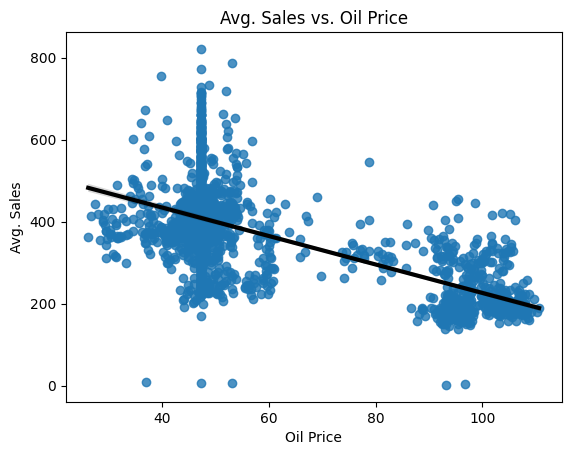

In [50]:
sns.regplot(data=avg_sales, x='oil_price', y='sales', 
           line_kws={'color':'black', 'linewidth':3})
plt.xlabel('Oil Price')
plt.ylabel('Avg. Sales')
plt.title('Avg. Sales vs. Oil Price')
plt.show()

At a consumer level, lower oil prices means more purchasing power for the customers. This explains why there's an increase in average sales since mid-2015.

The chart above clearly tells us that when there are lower oil prices the average units sold increases. Therefore, oil prices will be used as a variable for training.

**Store Analysis**

In [51]:
display(stores.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 54 entries, 0 to 53
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   store_nbr  54 non-null     int64 
 1   city       54 non-null     object
 2   state      54 non-null     object
 3   type       54 non-null     object
 4   cluster    54 non-null     int64 
dtypes: int64(2), object(3)
memory usage: 2.2+ KB


None

In [52]:
avg_sales = train.groupby('store_nbr') ['sales'].mean().reset_index()

In [53]:
store = stores.merge(avg_sales, on = "store_nbr", how = "left")


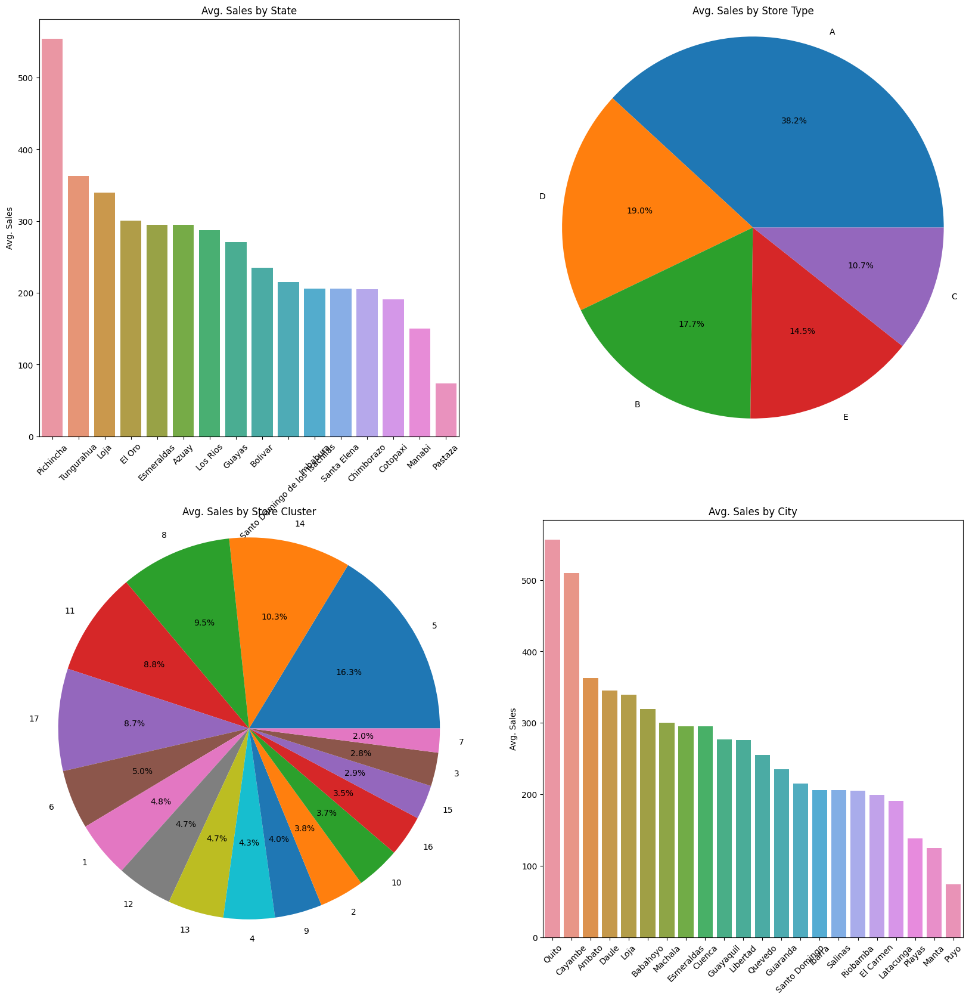

In [54]:
plt.figure(figsize=(20,20))

plt.subplot(2,2,1)

state_grouped = store.groupby("state")["sales"].mean().sort_values(ascending= False)
sns.barplot(x = state_grouped.index, y = state_grouped.values, ci=None, order=list(state_grouped.index) )

plt.xlabel('')
plt.xticks(rotation=45)
plt.ylabel('Avg. Sales')
plt.title('Avg. Sales by State')

plt.subplot(2,2,2)
type_grouped=store.groupby('type')['sales'].mean().sort_values(ascending=False)
plt.pie(type_grouped, labels=type_grouped.index, autopct="%1.1f%%")
plt.axis('equal')
plt.title('Avg. Sales by Store Type')

plt.subplot(2,2,3)
cluster_grouped=store.groupby('cluster')['sales'].mean().sort_values(ascending=False)
plt.pie(cluster_grouped, labels=cluster_grouped.index, autopct="%1.1f%%")
plt.axis('equal')
plt.title('Avg. Sales by Store Cluster')

plt.subplot(2,2,4)
city_grouped=store.groupby('city')['sales'].mean().sort_values(ascending=False)
sns.barplot(x=city_grouped.index, y=city_grouped.values,
           ci=None, order=list(city_grouped.index))
plt.xlabel('')
plt.xticks(rotation=45)
plt.ylabel('Avg. Sales')
plt.title('Avg. Sales by City')

plt.show()

The best States sells are ( Pichincha, Tungurahua, Loja ), while the worst are ( Cotopaxi, Manabi, Pastaza ).

The best Cities sells are ( Quito, Cayambe, Ambato ), while the worst are ( Playas, Manta, Puyo ).

The best Store Clusters sells are (5, 14, 8, 11), while the worst are (7, 3, 15, 16).

The order of best Store Type is: A -> D -> B -> E -> C.

All of these variable have impact on Favorita Supermarkets sales, So thew will be used in trainig.

In [55]:
missing_train_dates = (pd.date_range(
    start=train.date.min(),
    end=train.date.max())
    .difference(train.date)
)
print(train.date.max())
missing_train = list(product(missing_train_dates, train.store_nbr.unique(), train.family.unique()))
train_extra = pd.DataFrame(missing_train, columns=['date', 'store_nbr', 'family'])


train_dates = (pd.date_range(
    start=train.date.min(),
    end=train.date.max())
)

train_extra1 = pd.DataFrame(missing_train, columns=['date', 'store_nbr', 'family'])
train = pd.concat([train, train_extra1], ignore_index=True)
train.sales.fillna(0, inplace=True)
train.onpromotion.fillna(0, inplace=True)

missing_test_dates = (pd.date_range(
    start=test.date.min(),
    end=test.date.max())
    .difference(test.date)
)

missing_holiday_dates = (pd.DataFrame(
    pd.date_range(
    start=holidays.date.min(),
    end=holidays.date.max())
    .difference(holidays.date)
, columns=['date']))

holidays = pd.concat([holidays, missing_holiday_dates], ignore_index=True)

transferred_true = holidays[ (holidays['transferred'] == True)].index
holidays.drop(transferred_true , inplace=True)
holidays.drop(
    columns=['locale', 'locale_name', 'description', 'transferred'],
    inplace=True
    )



2017-08-15 00:00:00


In [56]:
merged = train.merge(
    stores,
    how='left',
    on=['store_nbr'])

merged.head()

,date,store_nbr,family,sales,onpromotion,city,state,type,cluster
0,2013-01-01,1,AUTOMOTIVE,0.00,0.00,Quito,Pichincha,D,13
1,2013-01-01,1,BABY CARE,0.00,0.00,Quito,Pichincha,D,13
2,2013-01-01,1,BEAUTY,0.00,0.00,Quito,Pichincha,D,13
3,2013-01-01,1,BEVERAGES,0.00,0.00,Quito,Pichincha,D,13
4,2013-01-01,1,BOOKS,0.00,0.00,Quito,Pichincha,D,13


In [57]:
merged['date'] = pd.to_datetime(merged['date'])
merged=merged.merge(
    transactions,
    how='left',
    on=['date', 'store_nbr'])

merged.head()

,date,store_nbr,family,sales,onpromotion,city,state,type,cluster,transactions
0,2013-01-01,1,AUTOMOTIVE,0.00,0.00,Quito,Pichincha,D,13,NaN
1,2013-01-01,1,BABY CARE,0.00,0.00,Quito,Pichincha,D,13,NaN
2,2013-01-01,1,BEAUTY,0.00,0.00,Quito,Pichincha,D,13,NaN
3,2013-01-01,1,BEVERAGES,0.00,0.00,Quito,Pichincha,D,13,NaN
4,2013-01-01,1,BOOKS,0.00,0.00,Quito,Pichincha,D,13,NaN


In [58]:
merged['date'] = pd.to_datetime(merged['date'])
merged=merged.merge(
    oil,
    how='left',
    on=['date'])

merged.head()

,date,store_nbr,family,sales,onpromotion,city,state,type,cluster,transactions,oil_price
0,2013-01-01,1,AUTOMOTIVE,0.00,0.00,Quito,Pichincha,D,13,NaN,93.14
1,2013-01-01,1,BABY CARE,0.00,0.00,Quito,Pichincha,D,13,NaN,93.14
2,2013-01-01,1,BEAUTY,0.00,0.00,Quito,Pichincha,D,13,NaN,93.14
3,2013-01-01,1,BEVERAGES,0.00,0.00,Quito,Pichincha,D,13,NaN,93.14
4,2013-01-01,1,BOOKS,0.00,0.00,Quito,Pichincha,D,13,NaN,93.14


In [59]:
merged['date'] = pd.to_datetime(merged['date'])
merged=merged.merge(holidays,
    how='left',
    on=['date'])

merged

,date,store_nbr,family,sales,onpromotion,city,state,type_x,cluster,transactions,oil_price,type_y
0,2013-01-01,1,AUTOMOTIVE,0.00,0.00,Quito,Pichincha,D,13,NaN,93.14,Holiday
1,2013-01-01,1,BABY CARE,0.00,0.00,Quito,Pichincha,D,13,NaN,93.14,Holiday
2,2013-01-01,1,BEAUTY,0.00,0.00,Quito,Pichincha,D,13,NaN,93.14,Holiday
3,2013-01-01,1,BEVERAGES,0.00,0.00,Quito,Pichincha,D,13,NaN,93.14,Holiday
4,2013-01-01,1,BOOKS,0.00,0.00,Quito,Pichincha,D,13,NaN,93.14,Holiday
...,...,...,...,...,...,...,...,...,...,...,...,...
3061471,2016-12-25,9,POULTRY,0.00,0.00,Quito,Pichincha,B,6,0.00,47.26,Holiday
3061472,2016-12-25,9,PREPARED FOODS,0.00,0.00,Quito,Pichincha,B,6,0.00,47.26,Holiday
3061473,2016-12-25,9,PRODUCE,0.00,0.00,Quito,Pichincha,B,6,0.00,47.26,Holiday
3061474,2016-12-25,9,SCHOOL AND OFFICE SUPPLIES,0.00,0.00,Quito,Pichincha,B,6,0.00,47.26,Holiday


In [60]:
from sklearn.impute import SimpleImputer

# Assuming merged is your DataFrame

# Impute missing values in the 'type_y' column
imputer = SimpleImputer(missing_values=np.NaN, strategy='constant', fill_value='Work Day')
merged['type_y'] = imputer.fit_transform(merged[['type_y']])[:, 0]

# Set the 'date' column as the index
merged = merged.set_index(['date'])

# Fill remaining NaN values with 0
merged = merged.fillna(0)

# Save to CSV
merged.to_csv("merged_data.csv")



In [61]:
import numpy as np
import pandas as pd
from sklearn.calibration import LabelEncoder
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error

merged = pd.read_csv("/kaggle/working/merged_data.csv")

merged['date'] = pd.to_datetime(merged['date'])
cols = ['family', 'city', 'state', 'cluster', 'type_y', 'type_x','onpromotion']
for col in cols:
  encoder = LabelEncoder()
  merged[col] = encoder.fit_transform(merged[col])
  unique_encoded_values = merged[col].unique()
  if col =='family':
    original_values = encoder.inverse_transform(unique_encoded_values)
    for encoded, original in zip(unique_encoded_values, original_values):
        print(f"Encoded: {encoded} -> Original: {original}")


grouped_data = merged.groupby(['date','store_nbr'], as_index=False)['sales'].sum()
print(grouped_data.head())


merged.sort_values(by='date', inplace=True)

resampled_sales = grouped_data.set_index('date')

merged.to_csv("encoded.csv")
resampled_sales.to_csv("encoded_sum.csv")



Encoded: 0 -> Original: AUTOMOTIVE
Encoded: 1 -> Original: BABY CARE
Encoded: 2 -> Original: BEAUTY
Encoded: 3 -> Original: BEVERAGES
Encoded: 4 -> Original: BOOKS
Encoded: 5 -> Original: BREAD/BAKERY
Encoded: 6 -> Original: CELEBRATION
Encoded: 7 -> Original: CLEANING
Encoded: 8 -> Original: DAIRY
Encoded: 9 -> Original: DELI
Encoded: 10 -> Original: EGGS
Encoded: 11 -> Original: FROZEN FOODS
Encoded: 12 -> Original: GROCERY I
Encoded: 13 -> Original: GROCERY II
Encoded: 14 -> Original: HARDWARE
Encoded: 15 -> Original: HOME AND KITCHEN I
Encoded: 16 -> Original: HOME AND KITCHEN II
Encoded: 17 -> Original: HOME APPLIANCES
Encoded: 18 -> Original: HOME CARE
Encoded: 19 -> Original: LADIESWEAR
Encoded: 20 -> Original: LAWN AND GARDEN
Encoded: 21 -> Original: LINGERIE
Encoded: 22 -> Original: LIQUOR,WINE,BEER
Encoded: 23 -> Original: MAGAZINES
Encoded: 24 -> Original: MEATS
Encoded: 25 -> Original: PERSONAL CARE
Encoded: 26 -> Original: PET SUPPLIES
Encoded: 27 -> Original: PLAYERS AND 

In [62]:
encoded = pd.read_csv('/kaggle/working/encoded.csv')

encoded.head()


,Unnamed: 0,date,store_nbr,family,sales,onpromotion,city,state,type_x,cluster,transactions,oil_price,type_y
0,0,2013-01-01,1,0,0.00,0,18,12,3,12,0.00,93.14,3
1,1194,2013-01-01,42,6,0.00,0,3,0,3,1,0.00,93.14,3
2,1193,2013-01-01,42,5,0.00,0,3,0,3,1,0.00,93.14,3
3,1192,2013-01-01,42,4,0.00,0,3,0,3,1,0.00,93.14,3
4,1191,2013-01-01,42,3,0.00,0,3,0,3,1,0.00,93.14,3


In [63]:
encoded_sum = pd.read_csv('/kaggle/working/encoded_sum.csv')

encoded_sum.head()

,date,store_nbr,sales
0,2013-01-01,1,0.00
1,2013-01-01,2,0.00
2,2013-01-01,3,0.00
3,2013-01-01,4,0.00
4,2013-01-01,5,0.00


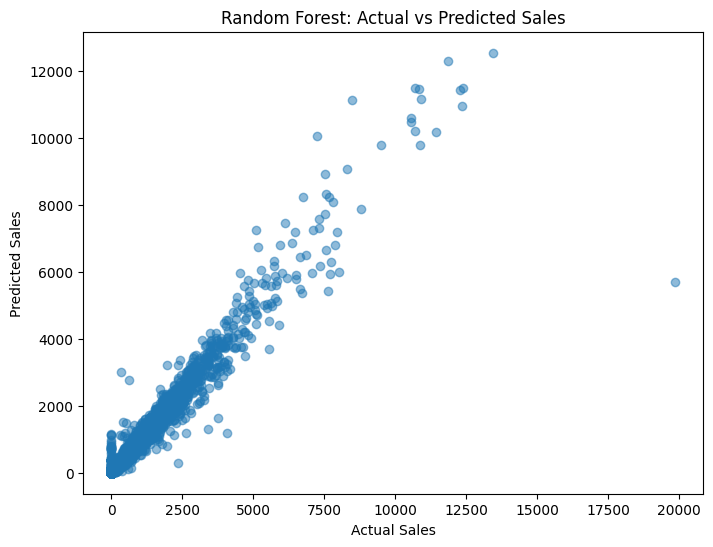

In [64]:
import numpy as np
import pandas as pd
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt

# Assuming you have already loaded your data into the 'encoded' DataFrame

# Split the data into training and evaluation sets
train, eval_set = encoded[20000:], encoded[:20000]

# Extract features and target
x_train = train.drop(['sales', 'date'], axis=1)
y_train = train['sales']
x_eval = eval_set.drop(['sales', 'date'], axis=1)
y_eval = eval_set['sales']

# Random Forest model
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
model_rf = rf_model.fit(x_train, y_train)

# Make predictions on the evaluation set
rf_pred = model_rf.predict(x_eval)

# Evaluate the model performance
mse_rf = mean_squared_error(y_eval, rf_pred)
rmse_rf = np.sqrt(mse_rf).round(2)


# Scatter plot of predicted vs actual values
plt.figure(figsize=(8, 6))
plt.scatter(y_eval, rf_pred, alpha=0.5)
plt.xlabel('Actual Sales')
plt.ylabel('Predicted Sales')
plt.title('Random Forest: Actual vs Predicted Sales')
plt.show()

